# EDA on Recidivism Data

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
df=pd.read_csv('/content/drive/MyDrive/411/recidivism.csv')
df

,black,alcohol,drugs,super,married,felon,workprg,property,person,priors,educ,rules,age,tserved,follow,durat,cens,ldurat
0,0,1,0,1,1,0,1,0,0,0,7,2,441,30,72,72,1,4.276666
1,1,0,0,1,0,1,1,1,0,0,12,0,307,19,75,75,1,4.317488
2,0,0,0,0,0,0,1,1,0,0,9,5,262,27,81,9,0,2.197225
3,0,0,1,1,0,1,1,1,0,2,9,3,253,38,76,25,0,3.218876
4,0,0,1,1,0,0,0,0,0,0,9,0,244,4,81,81,1,4.394449
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1440,0,1,1,1,0,0,0,0,0,0,12,0,393,8,80,80,1,4.382027
1441,1,0,0,1,1,1,0,1,0,0,12,0,345,12,73,73,1,4.290460
1442,1,0,0,0,0,0,1,0,0,0,11,3,264,36,81,81,1,4.394449
1443,0,0,0,1,1,0,1,0,0,0,12,0,374,9,81,81,1,4.394449


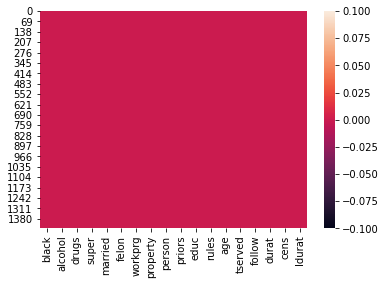

In [ ]:
sns.heatmap(df.isnull())

1 81


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


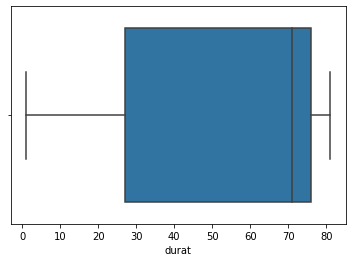

In [ ]:
sns.boxplot(df['durat'])
print(df['durat'].min(), df['durat'].max())

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)


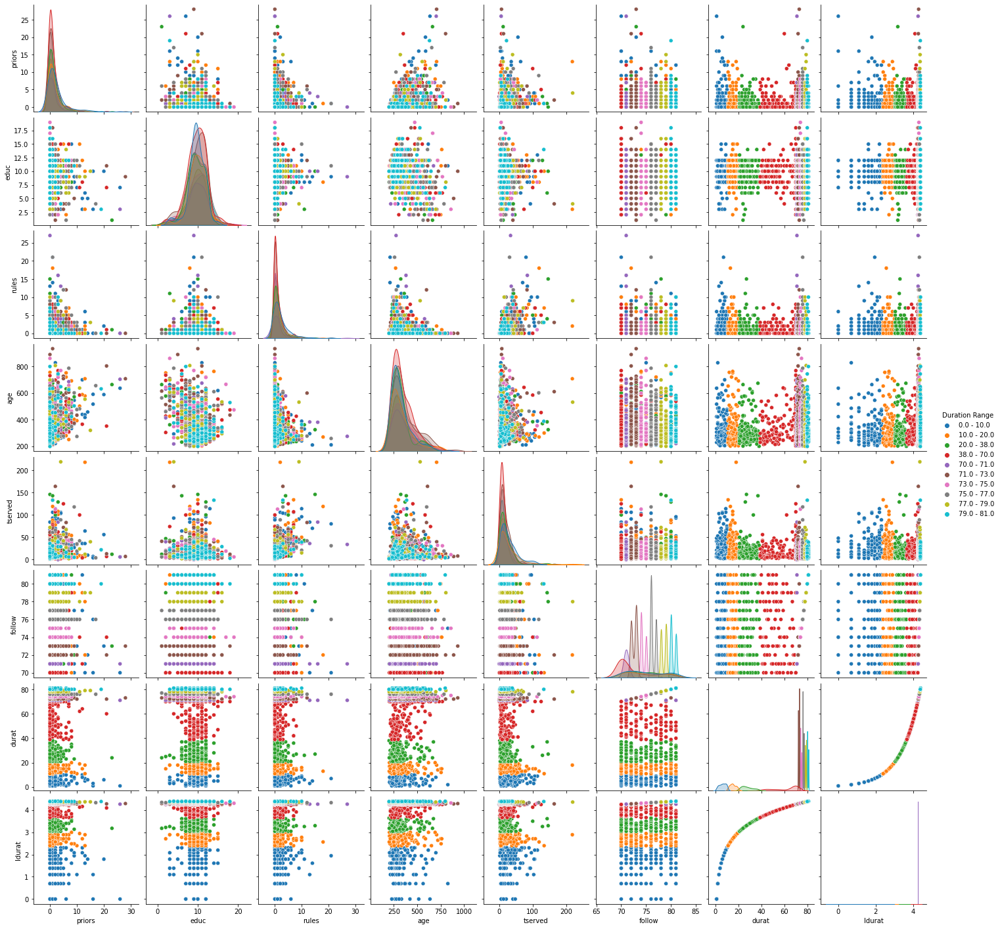

In [ ]:
df['Duration Range']=pd.qcut(df['durat'], 10, retbins=False, precision=0).astype(str).str.replace(',', ' -').str.lstrip('(').str.rstrip(']')
df=df.sort_values(by='Duration Range').reset_index(drop=True)
sns.pairplot(data = df, vars=['priors',	'educ',	'rules',	'age',	'tserved',	'follow', 'durat', 'ldurat'], hue='Duration Range')
plt.show()

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:1078: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:1078: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:1078: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:1078: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:1078: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWa

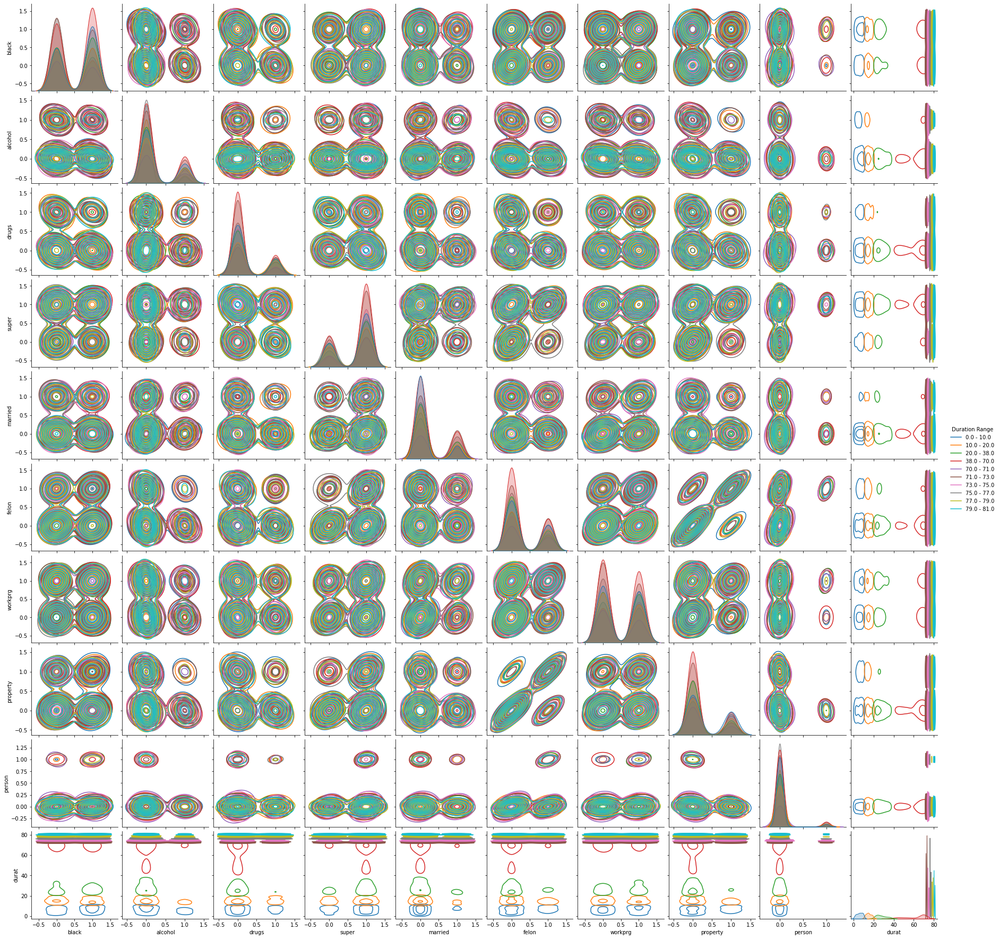

In [ ]:
sns.pairplot(data = df, vars=['black',	'alcohol',	'drugs',	'super',	'married',	'felon',	'workprg',	'property',	'person', 'durat'], hue='Duration Range', kind="kde")
plt.show()

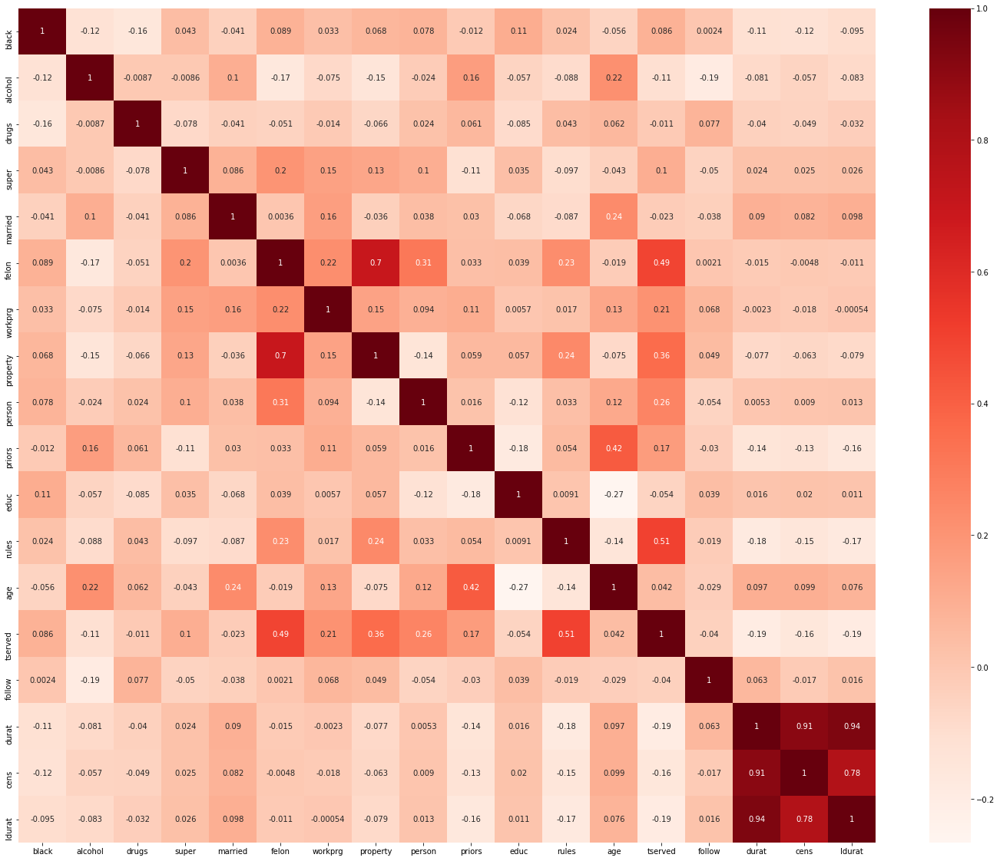

In [ ]:
fig, ax = plt.subplots(figsize=(25,20))
sns.heatmap(df.corr(), annot=True, cmap = 'Reds', ax=ax)
plt.show()

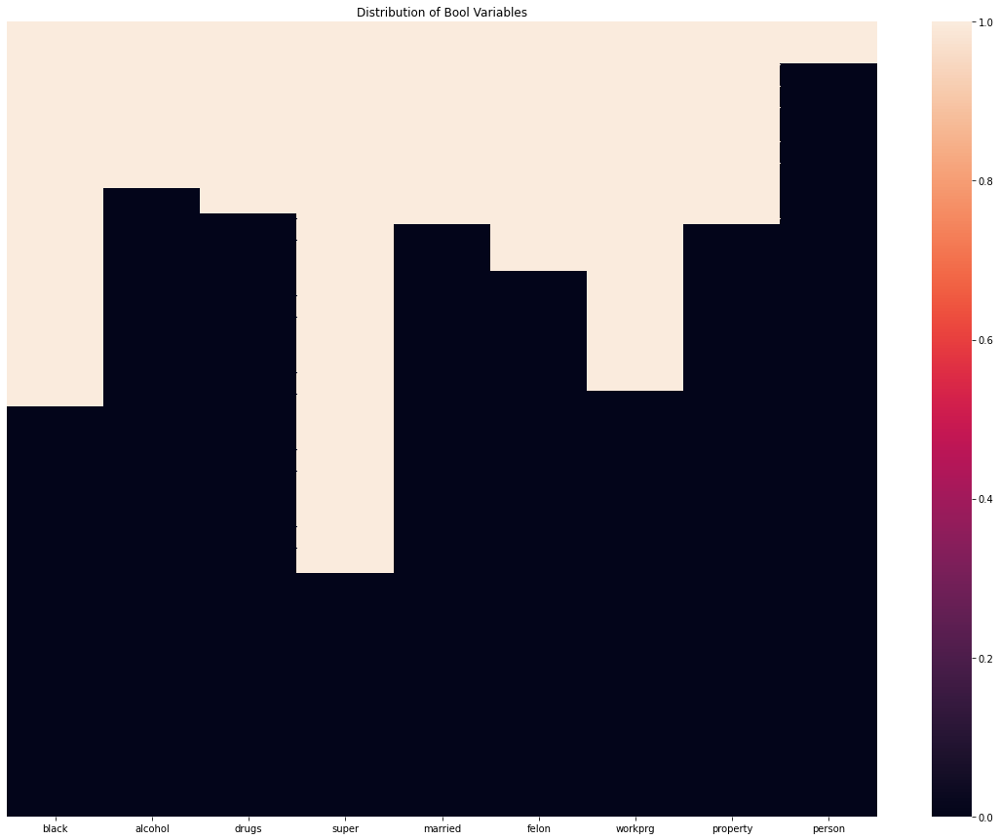

In [ ]:
df1=df[['black',	'alcohol',	'drugs',	'super',	'married',	'felon',	'workprg',	'property',	'person']].astype(bool)
df2=pd.DataFrame({'idxplace': range(len(df1.index))})
for i in df1.columns:
  col=df1[i].sort_values(ascending=False).reset_index(drop=True)
  df2[i]=col
del df2['idxplace']
fig, ax = plt.subplots(figsize=(20,15))
plt.title('Distribution of Bool Variables')
sns.heatmap(df2,ax=ax, yticklabels=False)
plt.show()

# Task 2

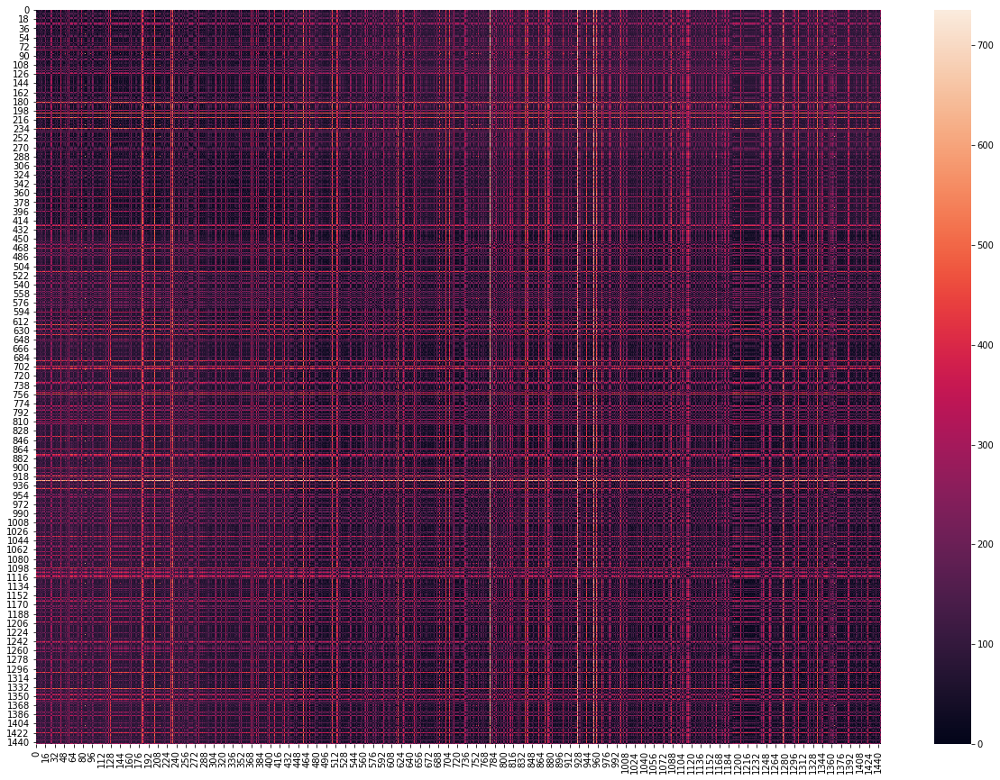

In [ ]:
import scipy
from scipy.spatial import distance_matrix
# del df['Duration Range']
dist_matrix=pd.DataFrame(distance_matrix(df.values, df.values), index=df.index, columns=df.index)
dist_matrix
fig, ax = plt.subplots(figsize=(21,15))
sns.heatmap(dist_matrix, ax=ax)
plt.show()

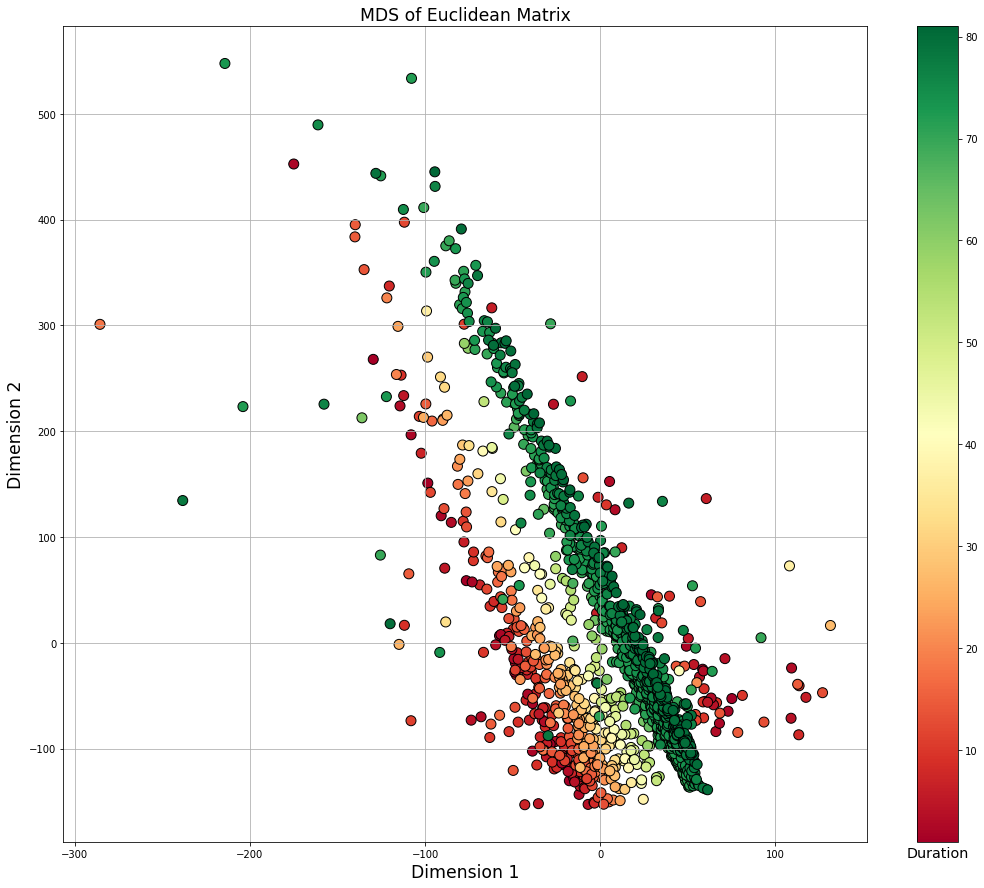

In [ ]:
from sklearn.manifold import MDS
import matplotlib.pyplot as plt
embedding = MDS(n_components=2, dissimilarity='euclidean', metric=True, random_state=np.random.RandomState(seed=42))
Xt = embedding.fit_transform(df.values)
X  = np.transpose(Xt)
Gram_Matrix = np.matmul(Xt,X)
eigenvalues = np.linalg.eigvalsh(Gram_Matrix)
MDS_df=pd.DataFrame(Xt, columns=['x', 'y'])
MDS_df['durat']=df['durat']
MDS_df['eigenvalues']=eigenvalues
fig, ax = plt.subplots(figsize=(18,15))
plt.scatter(MDS_df['x'], MDS_df['y'], cmap="RdYlGn", c=MDS_df['durat'], edgecolors="black", s=100, label='Duration')
plt.title('MDS of Euclidean Matrix', fontsize='xx-large')
plt.xlabel('Dimension 1', fontsize='xx-large')
plt.ylabel('Dimension 2', fontsize='xx-large')
cbar=plt.colorbar(use_gridspec=True)
cbar.ax.set_xlabel('Duration', rotation=0, fontsize='x-large')
ax.grid(True)
plt.plot(0,0)
plt.show()

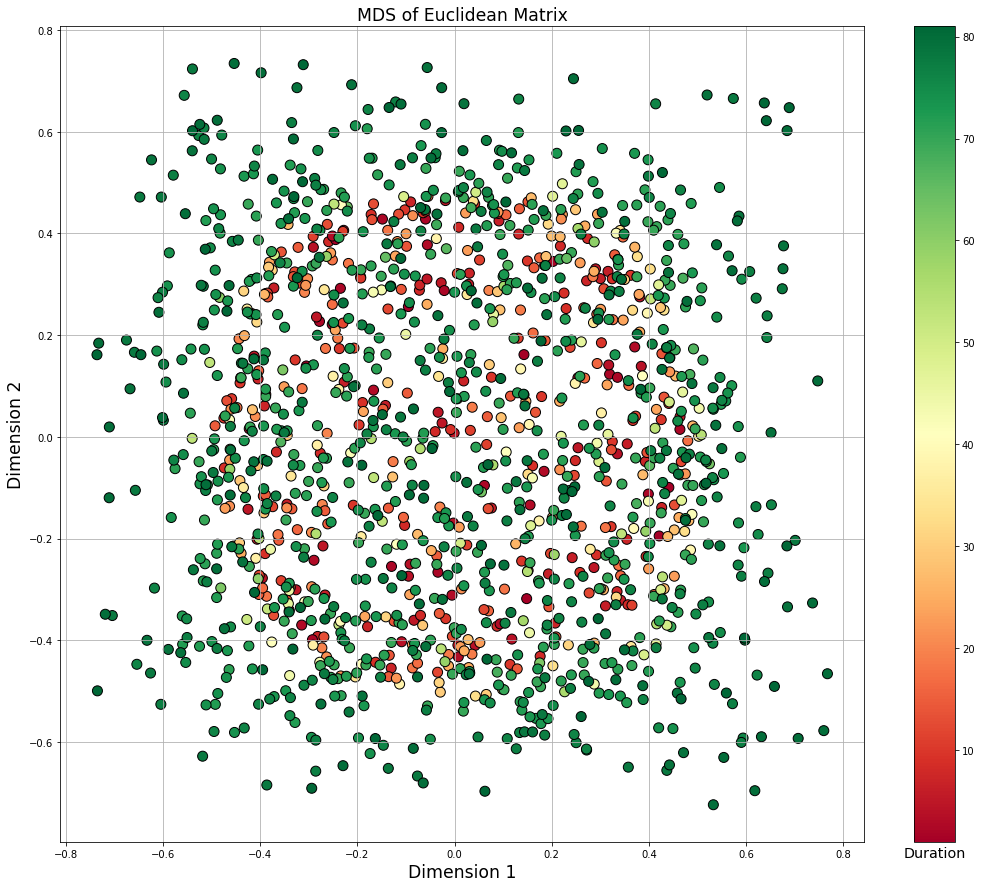

In [ ]:
from sklearn.manifold import MDS
import matplotlib.pyplot as plt
embedding = MDS(n_components=2, dissimilarity='euclidean', metric=False, random_state=np.random.RandomState(seed=42))
Xt = embedding.fit_transform(df)
X  = np.transpose(Xt)
Gram_Matrix = np.matmul(Xt,X)
eigenvalues = np.linalg.eigvalsh(Gram_Matrix)
MDS_df=pd.DataFrame(Xt, columns=['x', 'y'])
MDS_df['durat']=df['durat']
MDS_df['eigenvalues']=eigenvalues
fig, ax = plt.subplots(figsize=(18,15))
plt.scatter(MDS_df['x'], MDS_df['y'], cmap="RdYlGn", c=MDS_df['durat'], edgecolors="black", s=100, label='Duration')
plt.title('MDS of Euclidean Matrix', fontsize='xx-large')
plt.xlabel('Dimension 1', fontsize='xx-large')
plt.ylabel('Dimension 2', fontsize='xx-large')
cbar=plt.colorbar(use_gridspec=True)
cbar.ax.set_xlabel('Duration', rotation=0, fontsize='x-large')
ax.grid(True)
plt.plot(0,0)
plt.show()

In [ ]:
df2=pd.read_csv('/content/drive/MyDrive/411/college_acceptance.csv')
df2

,admit,gre,gpa,rank
0,0,380,3.61,3
1,1,660,3.67,3
2,1,800,4.00,1
3,1,640,3.19,4
4,0,520,2.93,4
...,...,...,...,...
395,0,620,4.00,2
396,0,560,3.04,3
397,0,460,2.63,2
398,0,700,3.65,2


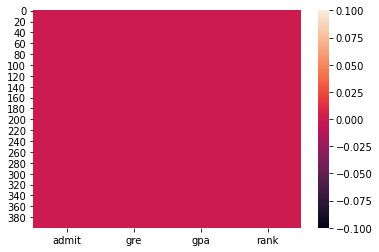

In [ ]:
sns.heatmap(df2.isnull())

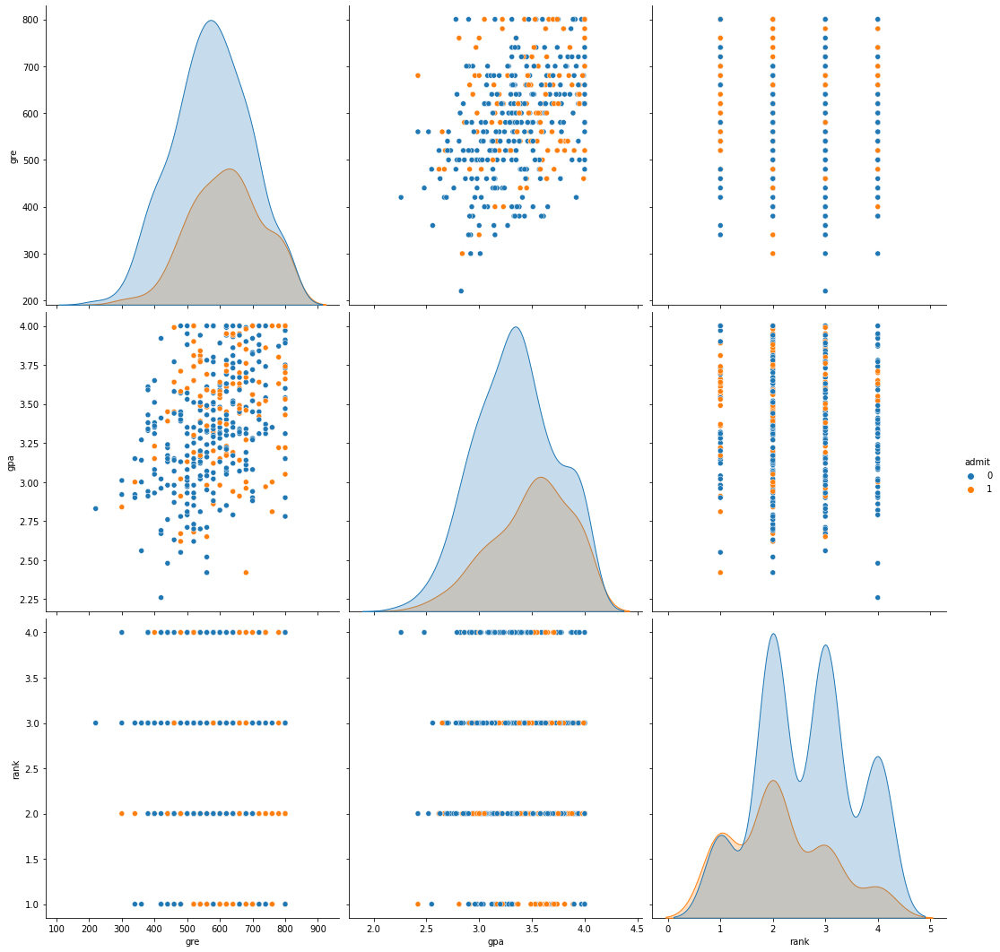

In [ ]:
ax=sns.pairplot(data = df2, hue='admit', height=5)
plt.show()

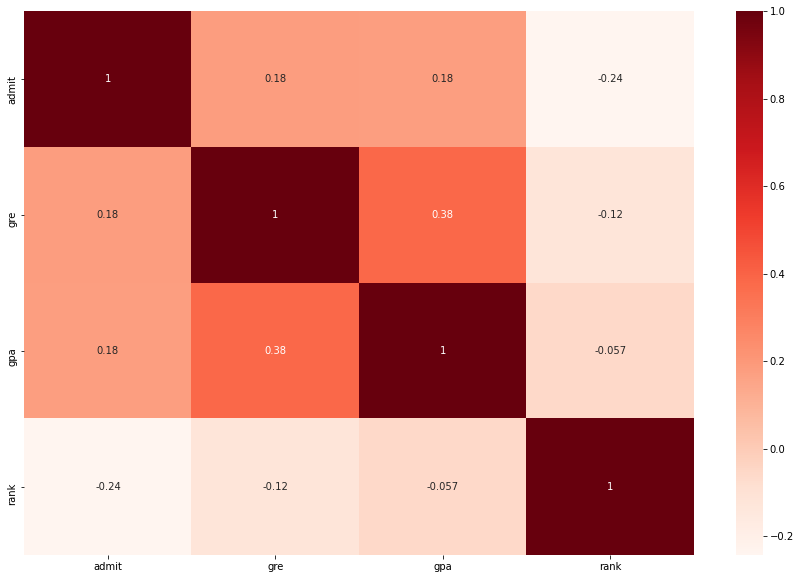

In [ ]:
fig, ax = plt.subplots(figsize=(15,10))
sns.heatmap(df2.corr(), annot=True, cmap = 'Reds', ax=ax)
plt.show()

In [ ]:
import rpy2
%load_ext rpy2.ipython

The rpy2.ipython extension is already loaded. To reload it, use:
  %reload_ext rpy2.ipython


NameError: ignored

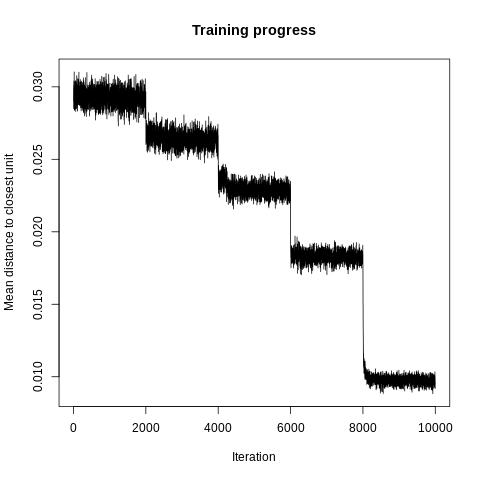

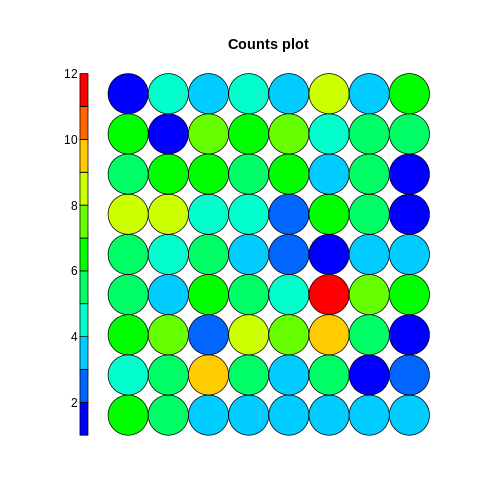

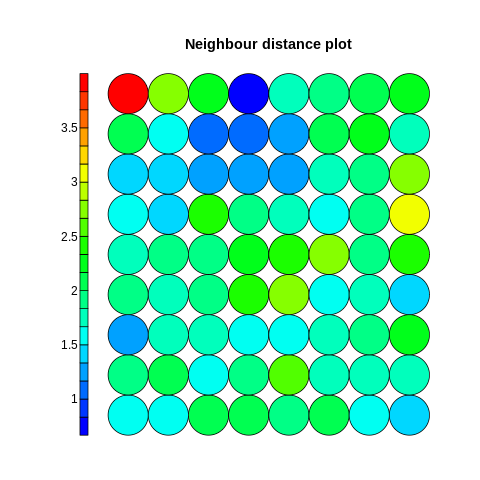

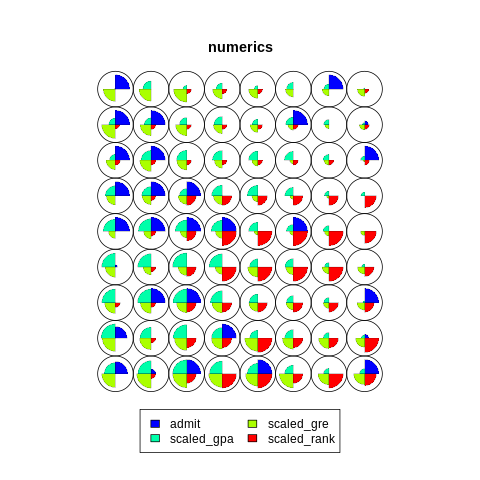

In [ ]:
%%R
library(vetools)
library(data.table)
library(readxl)
library(dplyr)
library(formattable)
library(readxl)
library(MASS)
library(ggthemes)
library(ggfortify)
library(RColorBrewer)
library(corrplot)
library(ggplot2)
library(kohonen)
library(DiagrammeR)

# Note: used https://github.com/bmoretz/MSDS-Unsupervised-Learning/blob/master/Assignment_03/BMoretz_Assignment_03.R for assistance as I had alot of trouble with this analysis

set.seed(42)
data.college <- as.data.table(read.csv("/content/drive/MyDrive/411/college_acceptance.csv"))

data.college$scaled_gre <- scale(data.college$gre)
data.college$scaled_gpa <- scale(data.college$gpa)
data.college$scaled_rank <- scale(data.college$rank)

p1 <- ggplot(data.college, aes(y = gre, group = admit)) + geom_boxplot(aes(fill = admit)) + labs(title = "Student GRE by Admit")

p2 <- ggplot(data.college, aes(y = gpa, group = admit)) + geom_boxplot(aes(fill = admit)) + labs(title = "Student GPA by Admit")

distances <- c("sumofsquares")
data.list = list()
factors <- c("admit")

data.list[["admit"]] <- classvec2classmat(data.college$admit)
data.list[["numerics"]] <- as.matrix(data.college[, .(admit, scaled_gpa, scaled_gre, scaled_rank)])



college.epochs <- 10000

som.grid <- somgrid(xdim = 8, ydim = 9, topo = "rectangular")

coolBlueHotRed <- function(n, alpha = 1) {rainbow(n, end=4/6, alpha=alpha)[n:1]}


cc.som <- supersom(data.list, grid = som.grid, rlen = college.epochs, alpha = c(0.1, 0.01), whatmap = c('admitted', 'numerics'), keep.data = TRUE)

plot(cc.som, type = "changes")
plot(cc.som, type = "counts", palette.name = coolBlueHotRed)
plot(cc.som, type = "dist.neighbours", palette.name = coolBlueHotRed)
plot(cc.som, type = "codes", palette.name = coolBlueHotRed)

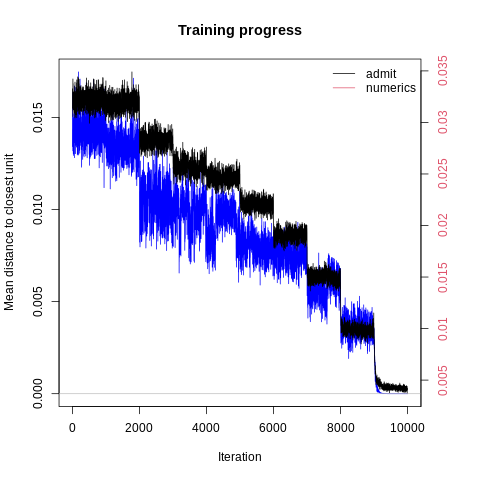

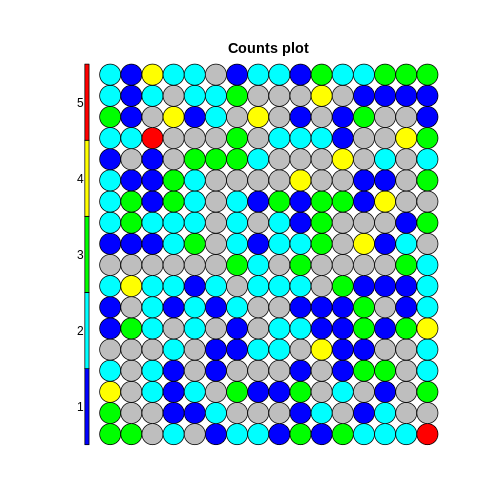

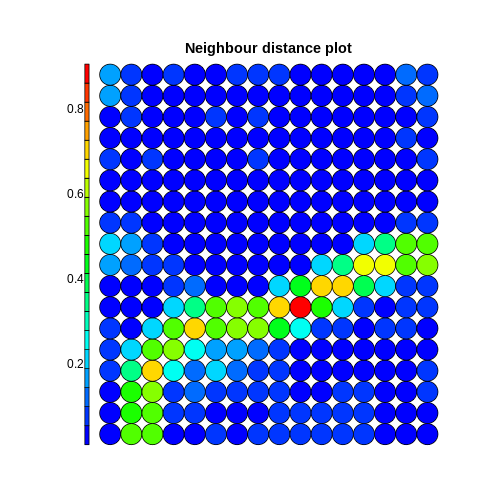

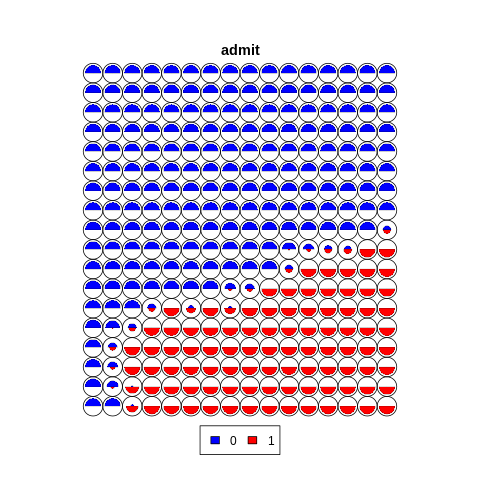

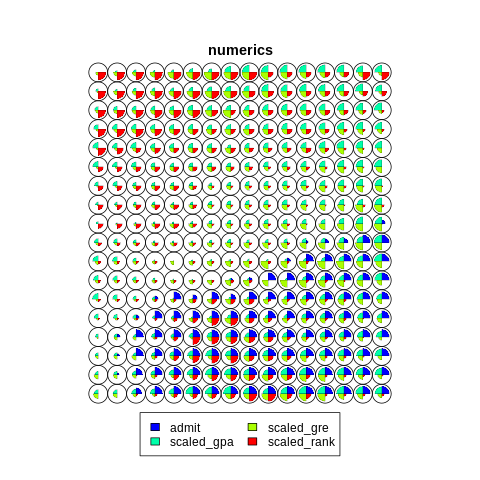

In [75]:
%%R

college.epochs <- 10000

som.grid <- somgrid(xdim = 16, ydim = 18, topo = "rectangular")

coolBlueHotRed <- function(n, alpha = 1) {rainbow(n, end=4/6, alpha=alpha)[n:1]}


cc.som <- supersom(data.list, grid = som.grid, rlen = college.epochs, alpha = c(0.1, 0.01), whatmap = c('admit', 'numerics'), keep.data = TRUE)

plot(cc.som, type = "changes", col=c("blue", "black"))

plot(cc.som, type = "counts", palette.name = coolBlueHotRed)

plot(cc.som, type = "dist.neighbours", palette.name = coolBlueHotRed)

plot(cc.som, type = "codes", palette.name = coolBlueHotRed)

[1] 2.040816


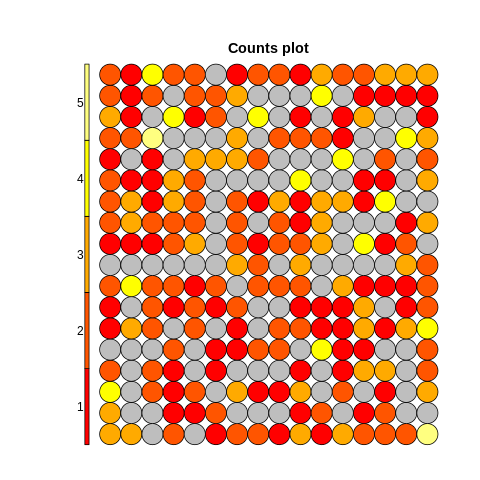

In [126]:
%%R
nodes <- table(cc.som$unit.classif)
print(mean(nodes))
plot(cc.som, type='counts')

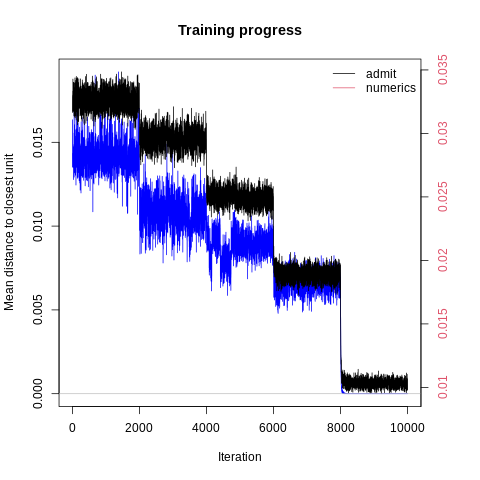

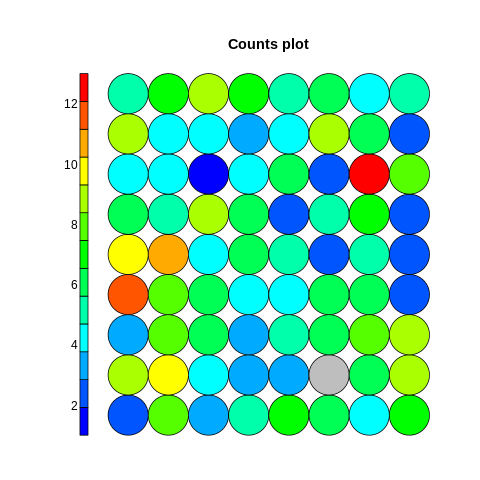

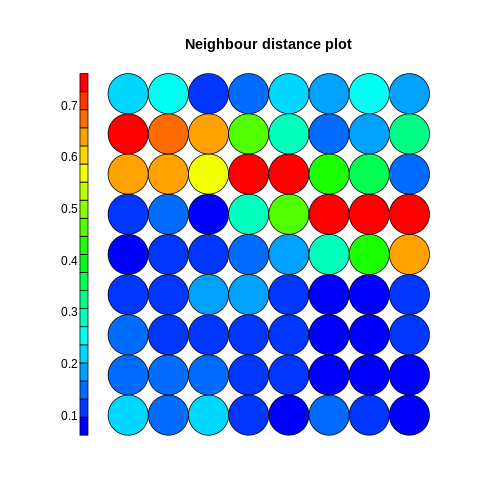

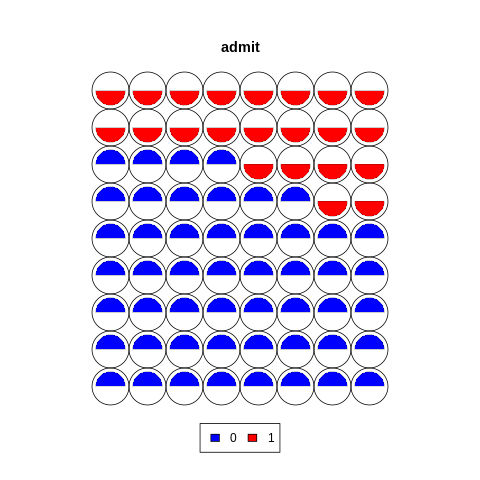

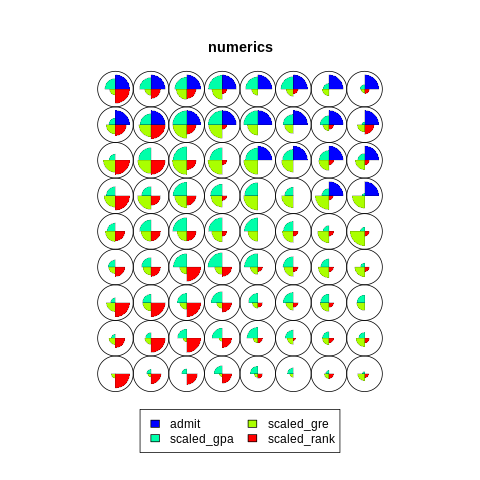

In [127]:
%%R

college.epochs <- 10000

som.grid <- somgrid(xdim = 8, ydim = 9, topo = "rectangular")

coolBlueHotRed <- function(n, alpha = 1) {rainbow(n, end=4/6, alpha=alpha)[n:1]}


cc.som <- supersom(data.list, grid = som.grid, rlen = college.epochs, alpha = c(0.1, 0.01), whatmap = c('admit', 'numerics'), keep.data = TRUE)

plot(cc.som, type = "changes", col=c("blue", "black"))

plot(cc.som, type = "counts", palette.name = coolBlueHotRed)

plot(cc.som, type = "dist.neighbours", palette.name = coolBlueHotRed)

plot(cc.som, type = "codes", palette.name = coolBlueHotRed)